# Masking data

**Notebook currently compatible with both `NCI` and `DEA Sandbox` environments**

### Description
In this notebook, we demonstrate how to mask data (keep only certain pixels in an image) using boolean masks.
We will mask out clouds and cloud shadows to obtain an image made of clear pixels.

### Technical details
* **Products used:** [s2a_ard_granule](https://explorer.sandbox.dea.ga.gov.au/s2a_ard_granule)
* **Analyses used:** cloud mask, image dilation

## Getting started
First we import relevant packages and create a datacube. Then we define our example area of interest.

In [1]:
%matplotlib inline

import sys
import scipy.ndimage
import xarray
import numpy

import datacube
from datacube.storage.masking import make_mask, mask_invalid_data


sys.path.append("../Scripts")
from dea_plotting import rgb

dc = datacube.Datacube(app="DEA_notebooks_masking data")

query = dict(x=(153.15, 153.25), y=(-28.83, -28.92), time=("2018-01", "2018-02"))

## Loading data

We will load surface reflectance RGB data along with a pixel classification band called `fmask`.

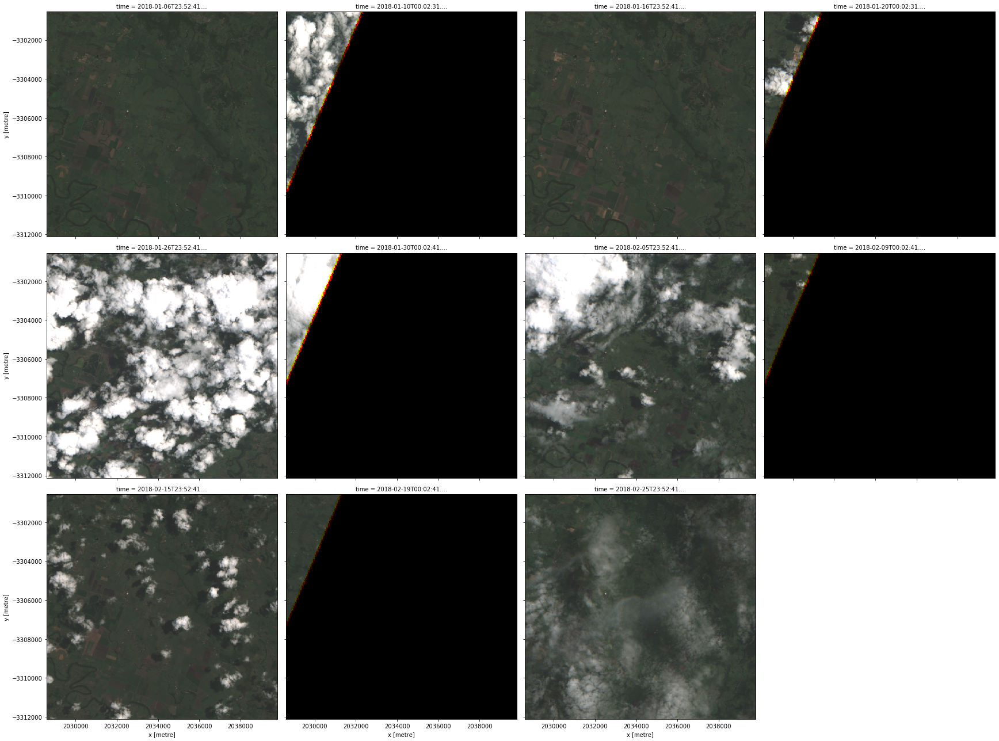

In [2]:
data = dc.load(product="s2a_ard_granule",
               measurements=["nbart_blue", "nbart_green", "nbart_red", "fmask"],
               output_crs="EPSG:3577",
               resolution=[-20, 20],
               resampling={
                   "fmask": "nearest",
                   "*": "average"
               },
               **query)

rgb(data, col="time")

These images show that our area of interest intersects only partially with the satellite track, and therefore some areas in the image have no observed data.

The absence of satellite observation is indicated by a "nodata" value for the band.

In [3]:
data.nbart_red

<xarray.DataArray 'nbart_red' (time: 11, y: 579, x: 560)>
array([[[ 392,  431, ...,  265,  265],
        [ 423,  354, ...,  260,  259],
        ...,
        [ 544,  554, ...,  302,  305],
        [ 535,  563, ...,  310,  330]],

       [[ 749,  722, ..., -999, -999],
        [ 755,  836, ..., -999, -999],
        ...,
        [-999, -999, ..., -999, -999],
        [-999, -999, ..., -999, -999]],

       ...,

       [[ 433,  421, ..., -999, -999],
        [ 458,  404, ..., -999, -999],
        ...,
        [-999, -999, ..., -999, -999],
        [-999, -999, ..., -999, -999]],

       [[ 453,  469, ...,  891,  992],
        [ 467,  434, ..., 1024, 1076],
        ...,
        [ 722,  732, ...,  543,  565],
        [ 697,  692, ...,  586,  587]]], dtype=int16)
Coordinates:
  * time     (time) datetime64[ns] 2018-01-06T23:52:41.026000 ... 2018-02-25T23:52:41.026000
  * y        (y) float64 -3.301e+06 -3.301e+06 ... -3.312e+06 -3.312e+06
  * x        (x) float64 2.029e+06 2.029e+06 2.029e+0

We see that the `nodata` attribute reports the value -999, and we also see some of the pixels have that value.

We can find the classification scheme of the `fmask` band in its flags definition.

In [4]:
data.fmask.attrs["flags_definition"]

{'fmask': {'bits': [0, 1, 2, 3, 4, 5, 6, 7],
  'values': {'0': 'nodata',
   '1': 'valid',
   '2': 'cloud',
   '3': 'shadow',
   '4': 'snow',
   '5': 'water'},
  'description': 'Fmask'}}

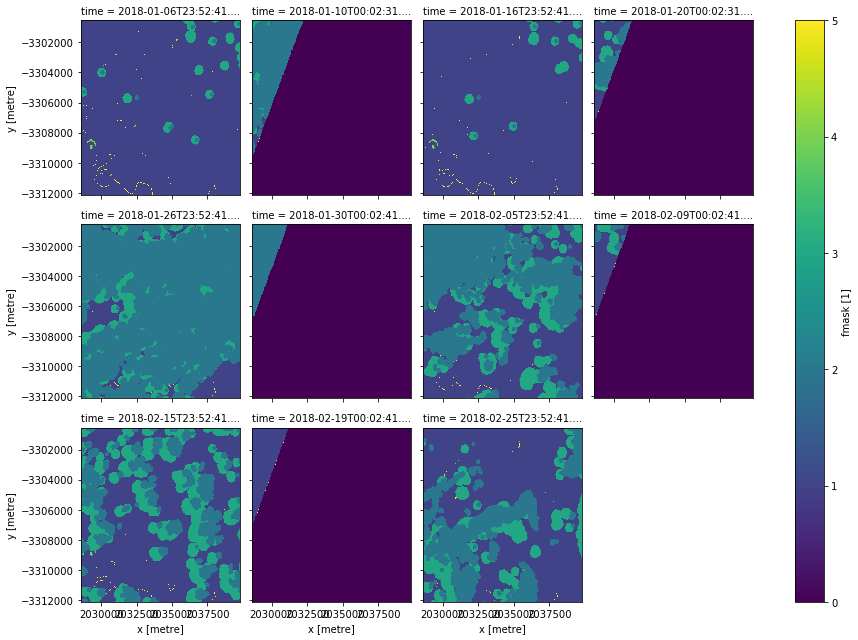

In [5]:
data.fmask.plot.imshow(col="time", col_wrap=4)

We see that `fmask` also reports the `nodata` pixels, and along with the cloud and shadow pixels, it picked up the river as water too.

## Cloud-free images

### Creating the clear-pixel mask

We create a mask by specifying conditions that our pixels must satisfy.

But we will only need the labels (not the values) to create a mask.

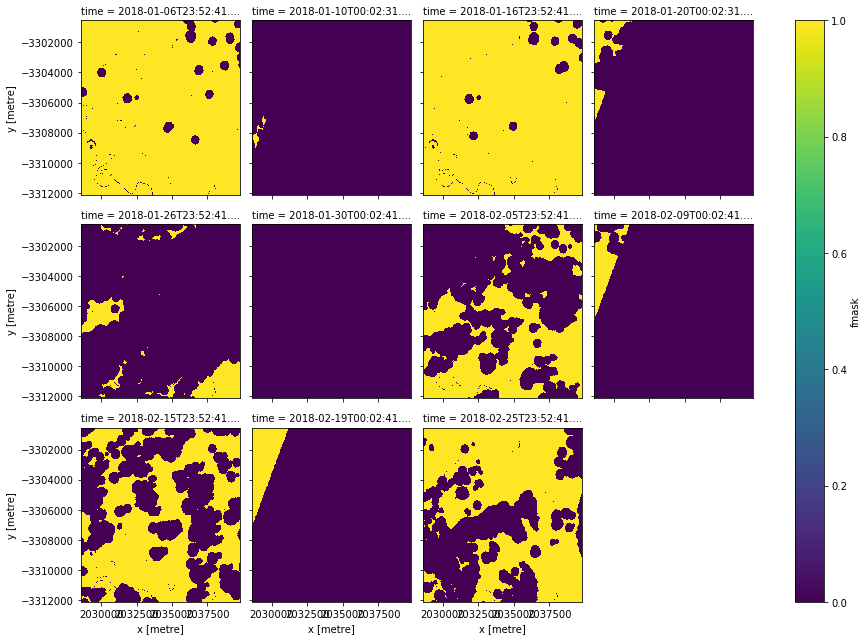

In [6]:
clear_mask = make_mask(data.fmask, fmask="valid")

clear_mask.plot.imshow(col="time", col_wrap=4)

### Applying the clear-pixel mask

We can now get the clear image we want.

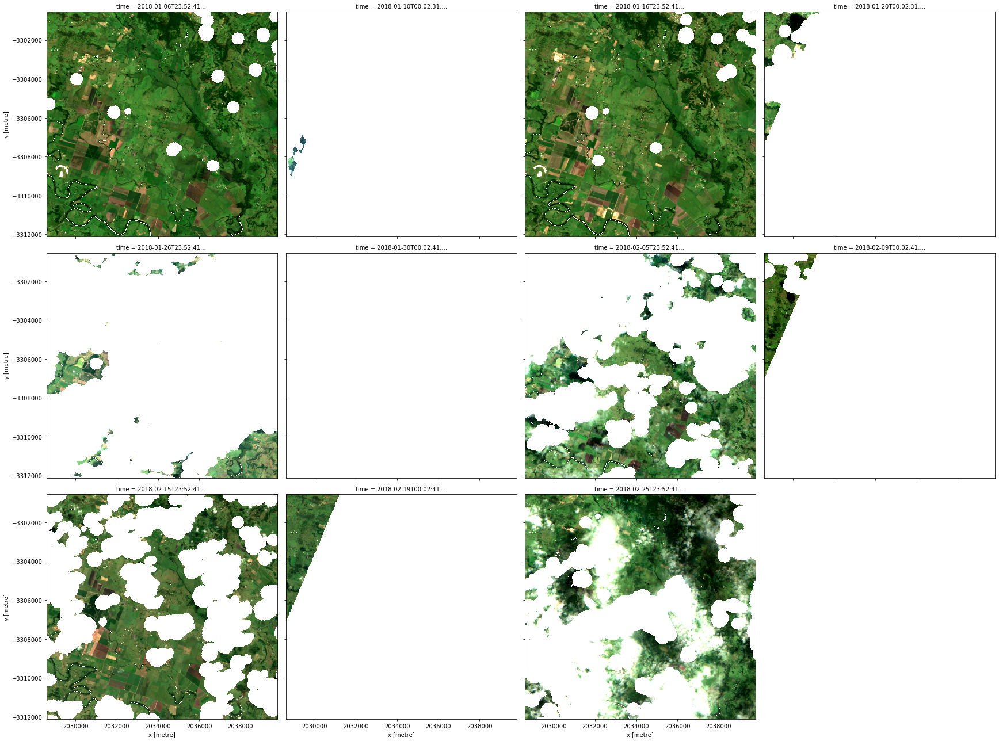

In [7]:
clear = data.where(clear_mask)

rgb(clear, col="time")

### Cloud-free images

If we look carefully, we can see that we have lost the river too.
Sometimes that may not be what we want.

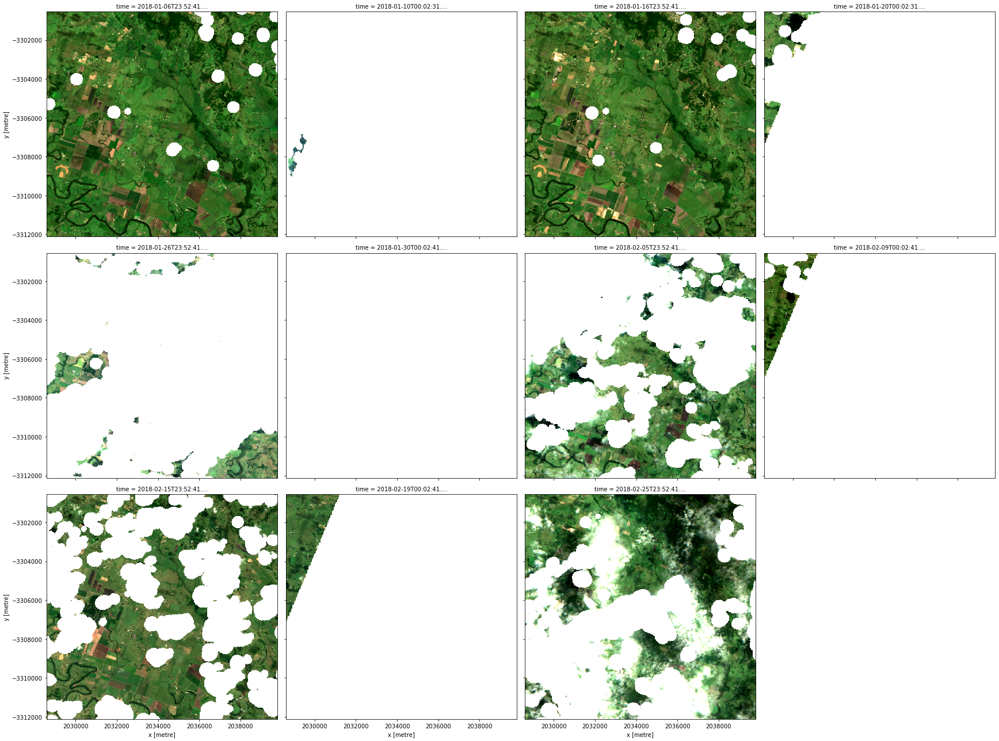

In [8]:
cloud_free_mask = (
    make_mask(data.fmask, fmask="valid")
    | make_mask(data.fmask, fmask="water")
    | make_mask(data.fmask, fmask="snow")
)

cloud_free = data.where(cloud_free_mask)

rgb(cloud_free, col="time")

## Mask dilation

Sometimes we want our cloud masks to be more conservative and mask out more than just the pixels that `fmask` classified as cloud or cloud shadow.
That is, sometimes we want a buffer around the cloud and the shadow.
We can achive this by dilating the mask.

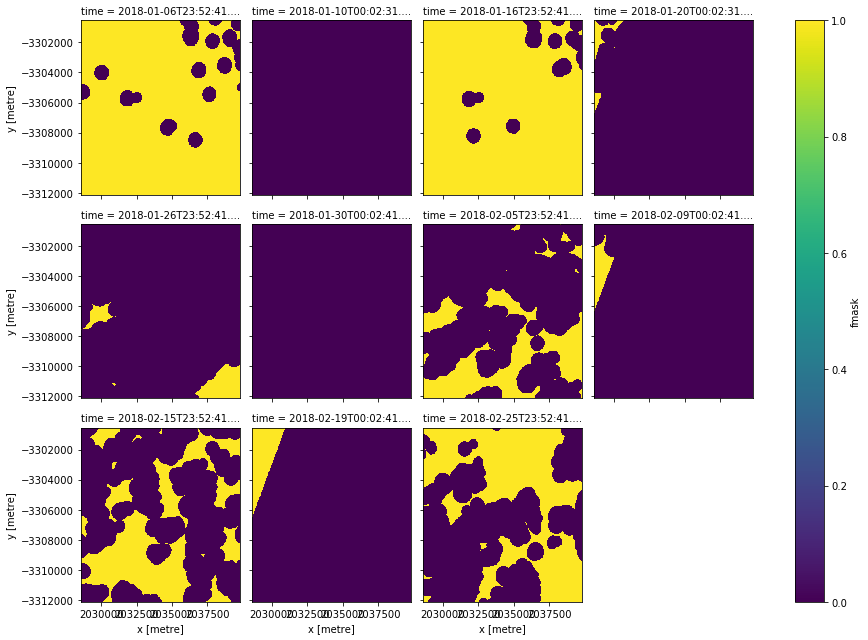

In [9]:
dilation_in_pixels = 10


def dilate(array):
    """
    Dilation e.g. for the mask.
    """
    y, x = numpy.ogrid[
        -dilation_in_pixels : (dilation_in_pixels + 1),
        -dilation_in_pixels : (dilation_in_pixels + 1),
    ]
    # disk-like radial dilation
    kernel = (x * x) + (y * y) <= (dilation_in_pixels + 0.5) ** 2
    return ~scipy.ndimage.binary_dilation(
        ~array.astype(numpy.bool), structure=kernel.reshape((1,) + kernel.shape)
    )


buffered_mask = xarray.apply_ufunc(dilate, cloud_free_mask, keep_attrs=True)

buffered_mask.plot.imshow(col="time", col_wrap=4)

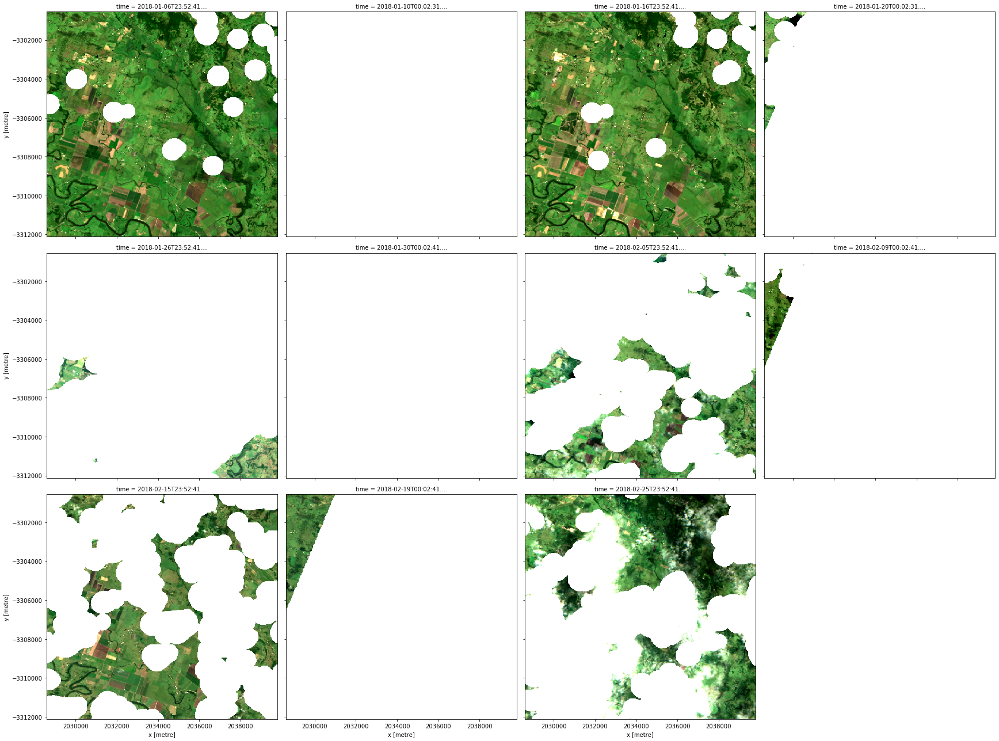

In [10]:
buffered_cloud_free = data.where(buffered_mask)

rgb(buffered_cloud_free, col="time")

## Masking out invalid data



We sometimes may also want to mask out only the nodata pixels and retain everything the satellite observed.
In this case we are effectively just replacing our `nodata` value with the more conventional `NaN` values.

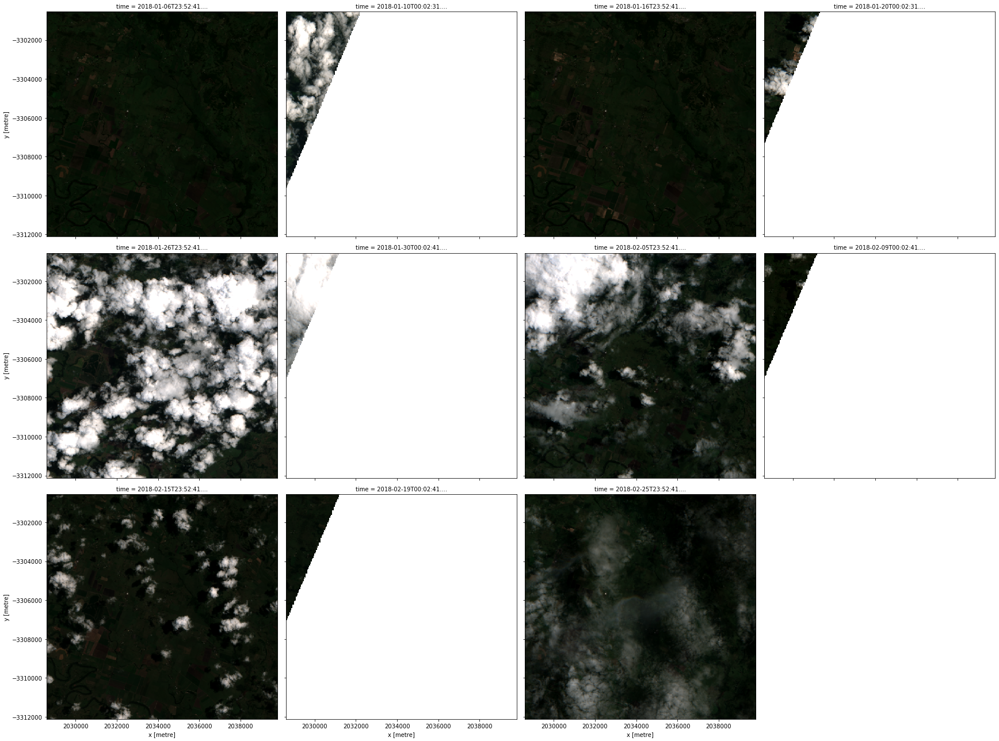

In [11]:
valid_data = mask_invalid_data(data)

rgb(valid_data, col='time')

In [12]:
valid_data.nbart_red

<xarray.DataArray 'nbart_red' (time: 11, y: 579, x: 560)>
array([[[ 392.,  431., ...,  265.,  265.],
        [ 423.,  354., ...,  260.,  259.],
        ...,
        [ 544.,  554., ...,  302.,  305.],
        [ 535.,  563., ...,  310.,  330.]],

       [[ 749.,  722., ...,   nan,   nan],
        [ 755.,  836., ...,   nan,   nan],
        ...,
        [  nan,   nan, ...,   nan,   nan],
        [  nan,   nan, ...,   nan,   nan]],

       ...,

       [[ 433.,  421., ...,   nan,   nan],
        [ 458.,  404., ...,   nan,   nan],
        ...,
        [  nan,   nan, ...,   nan,   nan],
        [  nan,   nan, ...,   nan,   nan]],

       [[ 453.,  469., ...,  891.,  992.],
        [ 467.,  434., ..., 1024., 1076.],
        ...,
        [ 722.,  732., ...,  543.,  565.],
        [ 697.,  692., ...,  586.,  587.]]])
Coordinates:
  * time     (time) datetime64[ns] 2018-01-06T23:52:41.026000 ... 2018-02-25T23:52:41.026000
  * y        (y) float64 -3.301e+06 -3.301e+06 ... -3.312e+06 -3.312e+06
  

## Additional information

**License:** The code in this notebook is licensed under the [Apache License, Version 2.0](https://www.apache.org/licenses/LICENSE-2.0). 
Digital Earth Australia data is licensed under the [Creative Commons by Attribution 4.0](https://creativecommons.org/licenses/by/4.0/) license.

**Contact:** If you need assistance, please post a question on the [Open Data Cube Slack channel](http://slack.opendatacube.org/) or on the [GIS Stack Exchange](https://gis.stackexchange.com/questions/ask?tags=open-data-cube) using the `open-data-cube` tag (you can view previously asked questions [here](https://gis.stackexchange.com/questions/tagged/open-data-cube)).
If you would like to report an issue with this notebook, you can file one on [Github](https://github.com/GeoscienceAustralia/dea-notebooks).

**Last modified:** October 2019

**Compatible `datacube` version:** 

In [13]:
print(datacube.__version__)

1.7+43.gc873f3ea


## Tags
Browse all available tags on the DEA User Guide's [Tags Index](https://docs.dea.ga.gov.au/genindex.html)